### Install modules in terminal

In [ ]:
!pip install matplotlib seaborn numpy pandas xarray rioxarray geopandas rasterio pillow pyproj scikit-learn pystac-client planetary-computer tqdm stackstac odc.stac

^C



[notice] A new release of pip available: 22.3.1 -> 25.0
[notice] To update, run: python.exe -m pip install --upgrade pip


### Import modules

In [2]:
# Supress Warnings
import warnings
warnings.filterwarnings('ignore')

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns

# Data Science
import numpy as np
import pandas as pd

# Multi-dimensional arrays and datasets
import xarray as xr

# Geospatial raster data handling
import rioxarray as rxr

# Geospatial data analysis
import geopandas as gpd

# Geospatial operations
import rasterio
from rasterio import windows  
from rasterio import features  
from rasterio import warp
from rasterio.warp import transform_bounds 
from rasterio.windows import from_bounds 

# Image Processing
from PIL import Image

# Coordinate transformations
from pyproj import Proj, Transformer, CRS

# Feature Engineering
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

# Machine Learning
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score

# Planetary Computer Tools
import pystac_client
import planetary_computer as pc
from pystac.extensions.eo import EOExtension as eo

# Others
import os
from tqdm import tqdm

# Import common GIS tools
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import rioxarray as rio
import rasterio
from matplotlib.cm import RdYlGn,jet,RdBu

# Import Planetary Computer tools
import stackstac
import pystac_client
import planetary_computer 
from odc.stac import stac_load


# Import config file
import config
import importlib
importlib.reload(config)

<module 'config' from 'c:\\Users\\winne\\Documents\\GitHub\\UHI\\config.py'>

### Fetch API

In [3]:
stac = pystac_client.Client.open("https://planetarycomputer.microsoft.com/api/stac/v1")

### Data search (From different dataset)

In [ ]:
sentinel_search = stac.search(
    bbox=config.bounds,
    datetime=config.time_window,
    collections=["sentinel-2-l2a"],
    query={"eo:cloud_cover": {"lt": 30}},
)


sentinel_items = list(sentinel_search.get_items())
print('This is the number of scenes that touch our region:',len(sentinel_items))


sentinel_signed_items = [planetary_computer.sign(item).to_dict() for item in sentinel_items]

sentinel_resolution = 10  # meters per pixel 
sentinel_scale = sentinel_resolution / 111320.0 # degrees per pixel for crs=4326 

This is the number of scenes that touch our region: 10


### Data Load

In [5]:
sentinel_data = stac_load(
    sentinel_items,
    bands=config.sentinel2_bands,
    crs="EPSG:4326", # Latitude-Longitude
    resolution=sentinel_scale, # Degrees
    chunks={"x": 2048, "y": 2048},
    dtype="uint16",
    patch_url=planetary_computer.sign,
    bbox=config.bounds,
)


### Extracting Data

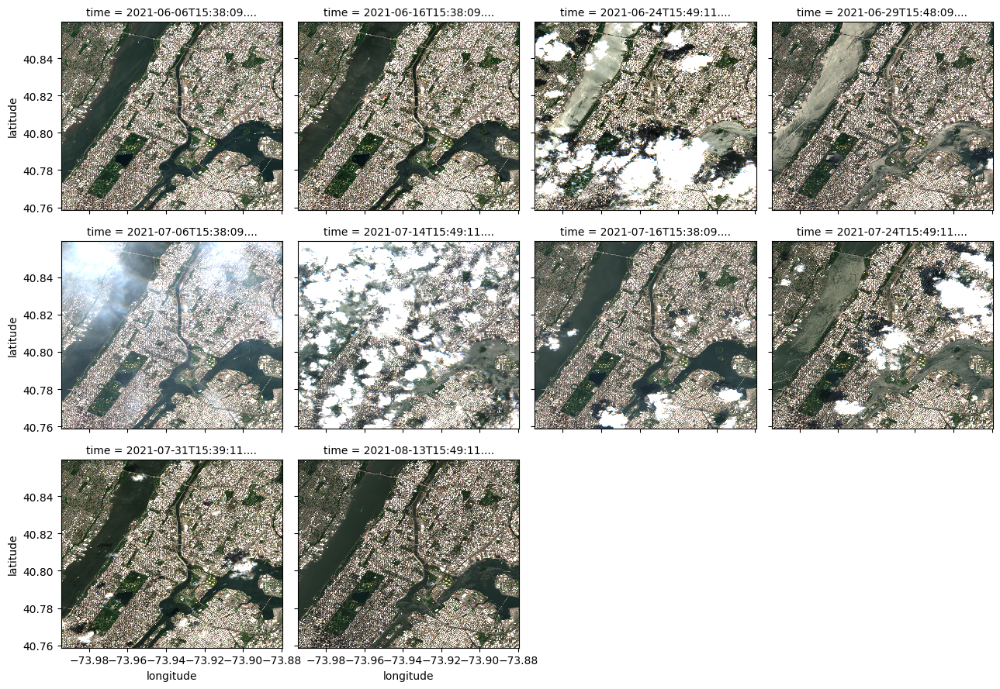

In [ ]:
# Plot sample images from the time series
plot_sentinel_data = sentinel_data[["B04","B03","B02"]].to_array()
plot_sentinel_data.plot.imshow(col='time', col_wrap=4, robust=True, vmin=0, vmax=2500)
plt.show()

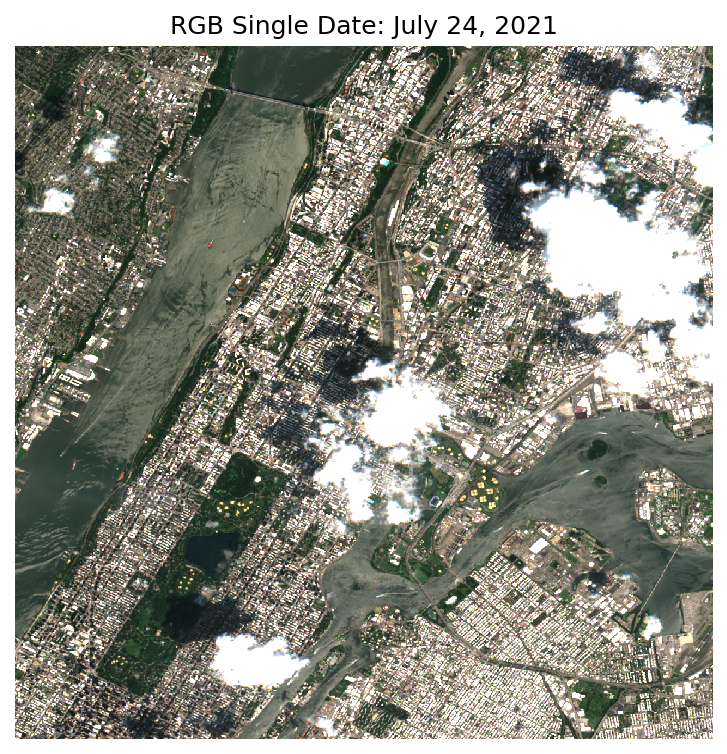

In [ ]:
# Plot an RGB image for a single date
fig, ax = plt.subplots(figsize=(6,6), dpi=150)
plot_sentinel_data.isel(time=7).plot.imshow(robust=True, ax=ax, vmin=0, vmax=2500)
ax.set_title("RGB Single Date: July 24, 2021")
ax.axis('off')
plt.show()

In [8]:
sentinel_median = sentinel_data.median(dim="time").compute()

### Processing Data

###### Median mosaic

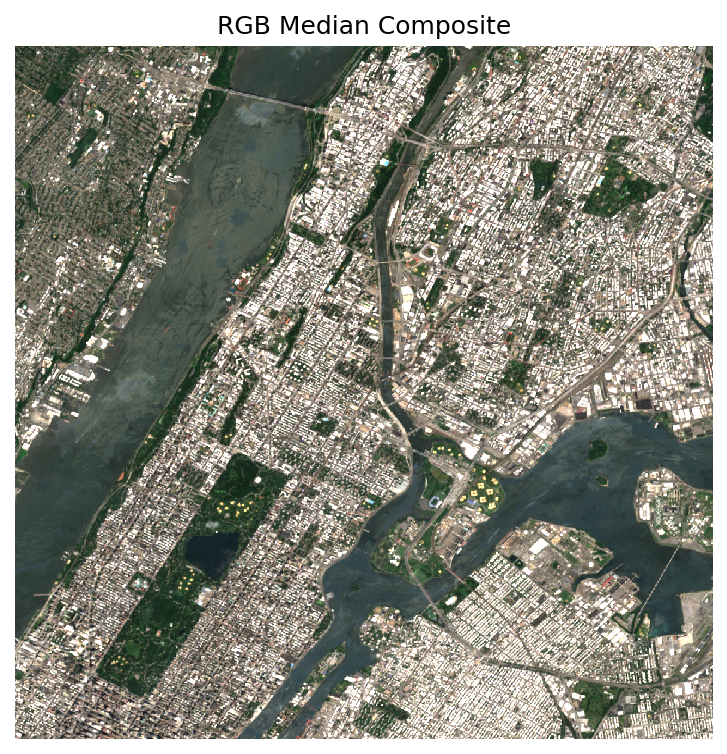

In [ ]:
# Plot an RGB image for the median composite or mosaic
# Notice how this new image is void of clouds due to statistical filtering
fig, ax = plt.subplots(figsize=(6,6), dpi=150)
sentinel_median[["B04", "B03", "B02"]].to_array().plot.imshow(robust=True, ax=ax, vmin=0, vmax=2500)
ax.set_title("RGB Median Composite")
ax.axis('off')
plt.show()

###### NDVI

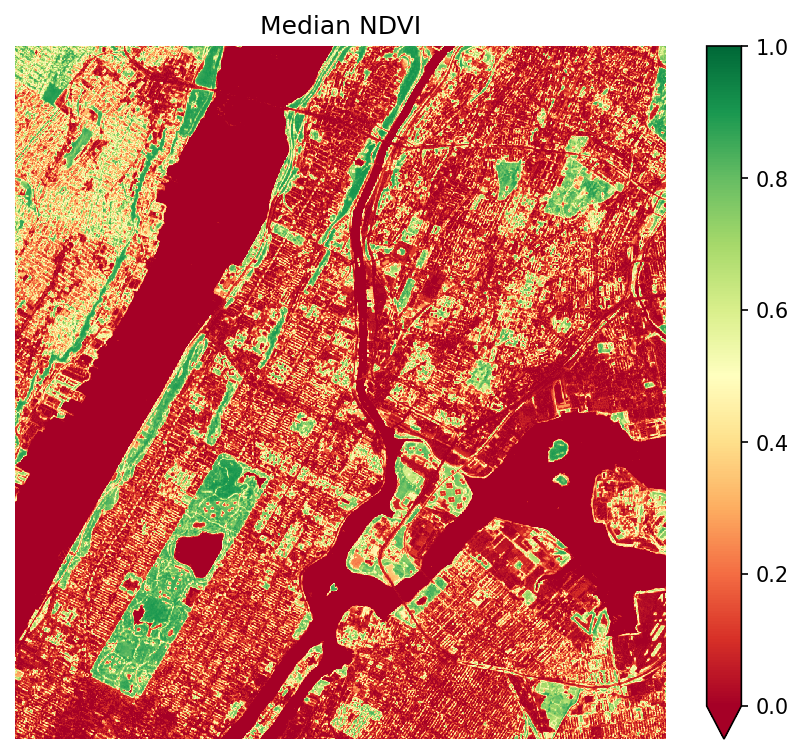

In [ ]:
# Calculate NDVI for the median mosaic
sentinel_ndvi_median = (sentinel_median.B08-sentinel_median.B04)/(sentinel_median.B08+sentinel_median.B04)

fig, ax = plt.subplots(figsize=(7,6), dpi=150)
sentinel_ndvi_median.plot.imshow(vmin=0.0, vmax=1.0, cmap="RdYlGn")
plt.title("Median NDVI")
plt.axis('off')
plt.show()

###### NDBI

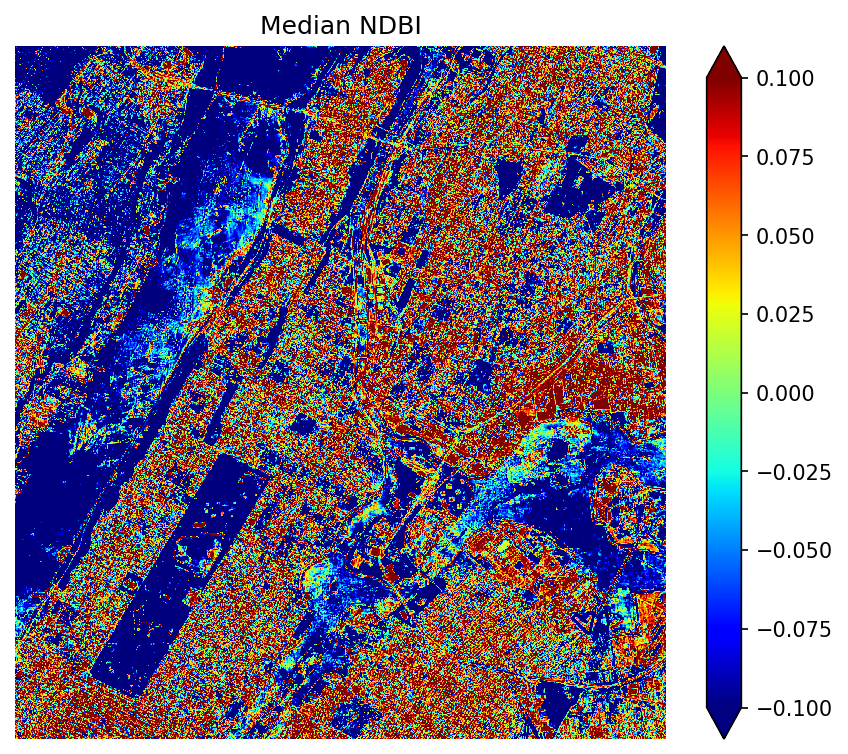

In [ ]:
# Calculate NDBI for the median mosaic
sentinel_ndbi_median = (sentinel_median.B11-sentinel_median.B08)/(sentinel_median.B11+sentinel_median.B08)

fig, ax = plt.subplots(figsize=(7,6), dpi=150)
sentinel_ndbi_median.plot.imshow(vmin=-0.1, vmax=0.1, cmap="jet")
plt.title("Median NDBI")
plt.axis('off')
plt.show()

###### NDWI

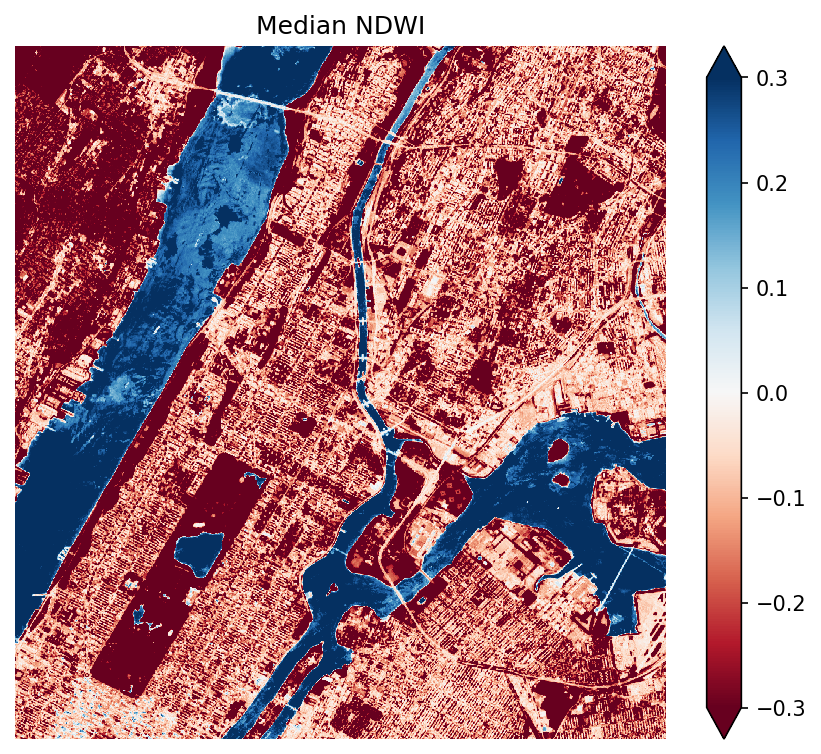

In [ ]:
# Calculate NDWI for the median mosaic
sentinel_ndwi_median = (sentinel_median.B03-sentinel_median.B08)/(sentinel_median.B03+sentinel_median.B08)

fig, ax = plt.subplots(figsize=(7,6), dpi=150)
sentinel_ndwi_median.plot.imshow(vmin=-0.3, vmax=0.3, cmap="RdBu")
plt.title("Median NDWI")
plt.axis('off')
plt.show()

### Processing Data

In [13]:
# We will pick a single time slice from the time series (time=7) 
# This time slice is the date of July 24, 2021
# sentinel_data_slice = sentinel_median.isel(time=7)
sentinel_data_slice = sentinel_median

In [14]:
height = sentinel_data_slice.dims["latitude"]
width = sentinel_data_slice.dims["longitude"]

#### Save dataset

In [15]:
# Define the Coordinate Reference System (CRS) to be common Lat-Lon coordinates
# Define the tranformation using our bounding box so the Lat-Lon information is written to the GeoTIFF
gt = rasterio.transform.from_bounds(config.lower_left[1],config.lower_left[0],config.upper_right[1],config.upper_right[0],width,height)

sentinel_data_slice.rio.write_crs("epsg:4326", inplace=True)
sentinel_data_slice.rio.write_transform(transform=gt, inplace=True); 

In [20]:
# Create the GeoTIFF output file using the defined parameters 
with rasterio.open(config.sentinel2_tiff,'w',driver='GTiff',width=width,height=height,
                   crs='epsg:4326',transform=gt,count=len(config.sentinel2_bands),compress='lzw',dtype='float64') as dst:
    for index, band in enumerate(config.sentinel2_bands, start=1):
        dst.write(getattr(sentinel_data_slice, band), index)
    dst.close()

12
